In [46]:
import ee
import geemap
import geopandas as gpd
import rasterio
from matplotlib import pyplot as plt
import numpy as np
from matplotlib import colors
from matplotlib.ticker import PercentFormatter
import plotly.express as px




In [47]:
Map=geemap.Map(center=[30,78],zoom=5)

In [48]:
in7=gpd.read_file('https://raw.githubusercontent.com/UdayKumar0711/wells/main/parewar.geojson')
# print(type(in7))

In [49]:
fc = geemap.geopandas_to_ee(in7)
# print(type(fc))

In [50]:
roi=fc.geometry()
# print(type(roi))

In [51]:
Esri_lulc=ee.ImageCollection("projects/sat-io/open-datasets/landcover/ESRI_Global-LULC_10m")


In [52]:
vis_params1={'min':1,'max':10,'palette':["#1A5BAB",
    "#358221",
    "#A7D282",
    "#87D19E",
    "#FFDB5C",
    "#EECFA8",
    "#ED022A",
    "#EDE9E4",
    "#F2FAFF",
    "#C8C8C8"]}

legend_dict = {
    '1 Open Water': '1A5BAB',
    '2 Trees': '358221',
    '3 Grass': 'A7D282',
    '4 Flooded Vegetation': '87D19E',
    '5 Crops': 'FFDB5C',
    '6 Shrub': 'EECFA8',
    '7 BuiltupArea': 'ED022A',
    '8 BareGround': 'EDE9E4',
    '9 Snow/Ice': 'F2FAFF',
    '10 Cloud': 'C8C8C8',
}


In [53]:
Map.addLayer(Esri_lulc,vis_params1,name='Esri_lulc')

In [54]:
vis_params = {
'min': 0,
'max': 1,
'palette': [ 'FFFFFF', 'CE7E45', 'DF923D', 'F1B555', 'FCD163', '99B718', '74A901','66A000', '529400', '3E8601', '207401', '056201', '004C00', '023B01',
          '012E01', '011D01', '011301']}
colors = vis_params['palette']
vmin = vis_params['min']
vmax = vis_params['max']


In [55]:

ndvi_7 = ee.Image("LANDSAT/LC08/C01/T1_32DAY_NDVI/20200711")
ndvi_8 = ee.Image("LANDSAT/LC08/C01/T1_32DAY_NDVI/20200812")
ndvi_9 = ee.Image("LANDSAT/LC08/C01/T1_32DAY_NDVI/20200913")
ndvi_10 = ee.Image("LANDSAT/LC08/C01/T1_32DAY_NDVI/20201015")
ndvi_11 = ee.Image("LANDSAT/LC08/C01/T1_32DAY_NDVI/20201116")
ndvi_12 = ee.Image("LANDSAT/LC08/C01/T1_32DAY_NDVI/20201218")


Map.addLayer(ndvi_7,vis_params,name='ndvi_july')
Map.addLayer(ndvi_8 ,vis_params,name='ndvi_aug ')
Map.addLayer(ndvi_9,vis_params,name='ndvi_sept')
Map.addLayer(ndvi_10,vis_params,name='ndvi_oct')
Map.addLayer(ndvi_11,vis_params,name='ndvi_nov')
Map.addLayer(ndvi_12,vis_params,name='ndvi_dec')


In [56]:
ndvi7 = ee.Image("LANDSAT/LC08/C01/T1_32DAY_NDVI/20200711").clip(roi)
ndvi8 = ee.Image("LANDSAT/LC08/C01/T1_32DAY_NDVI/20200812").clip(roi)
ndvi9 = ee.Image("LANDSAT/LC08/C01/T1_32DAY_NDVI/20200913").clip(roi)
ndvi10 = ee.Image("LANDSAT/LC08/C01/T1_32DAY_NDVI/20201015").clip(roi)
ndvi11 = ee.Image("LANDSAT/LC08/C01/T1_32DAY_NDVI/20201116").clip(roi)
ndvi12 = ee.Image("LANDSAT/LC08/C01/T1_32DAY_NDVI/20201218").clip(roi)

Map.addLayer(ndvi7,vis_params,name='ndvi_july_clipped')
Map.addLayer(ndvi8 ,vis_params,name='ndvi_aug_clipped ')
Map.addLayer(ndvi9,vis_params,name='ndvi_sept_clipped')
Map.addLayer(ndvi10,vis_params,name='ndvi_oct_clipped')
Map.addLayer(ndvi11,vis_params,name='ndvi_nov_clipped')
Map.addLayer(ndvi12,vis_params,name='ndvi_dec_clipped')


In [57]:
print('visualization of NDVI & LULC')

visualization of NDVI & LULC


In [86]:
Map.add_colorbar_branca(colors=colors, vmin=vmin, vmax=vmax, categorical=True, step=8,layer_name="ndvi",position='bottomleft')

Map

Map(bottom=3680.0, center=[30, 78], controls=(WidgetControl(options=['position', 'transparent_bg'], widget=HBo…

In [87]:
Map.add_legend(legend_title="LULC2020", legend_dict=legend_dict,position='bottomright')

In [60]:
Map1=geemap.Map(center=[30,78],zoom=5)

In [61]:
ndvi_series = ee.ImageCollection([ndvi_7,ndvi_8,ndvi_9,ndvi_10,ndvi_11,ndvi_12])

In [62]:
layer_names = ['2019_NDVI_month ' + str(months) for months in range(7, 13,1)]

In [63]:
Map1.ts_inspector(left_ts=ndvi_series, right_ts=ndvi_series, left_names=layer_names, right_names=layer_names, left_vis=vis_params, right_vis=vis_params)

In [64]:
print('visualization of temporal changes in NDVI')

visualization of temporal changes in NDVI


In [65]:
Map1

Map(center=[30, 78], controls=(WidgetControl(options=['position', 'transparent_bg'], widget=Dropdown(layout=La…

In [66]:
print('Histogram of NDVI')

Histogram of NDVI


In [67]:
# print(type(ndvi7))

In [68]:
rgb_img = geemap.ee_to_numpy(ndvi7, region=roi)

In [69]:
# print(type(rgb_img))

In [70]:
# print(rgb_img)

In [71]:
# geemap.ee_export_image_to_drive(ndvi7, description='ndvi7', folder='https://drive.google.com/drive/folders/1gxiCbZy7o6ea33PUM117taHp7OhENzDh?usp=sharing', region=roi, scale=90)

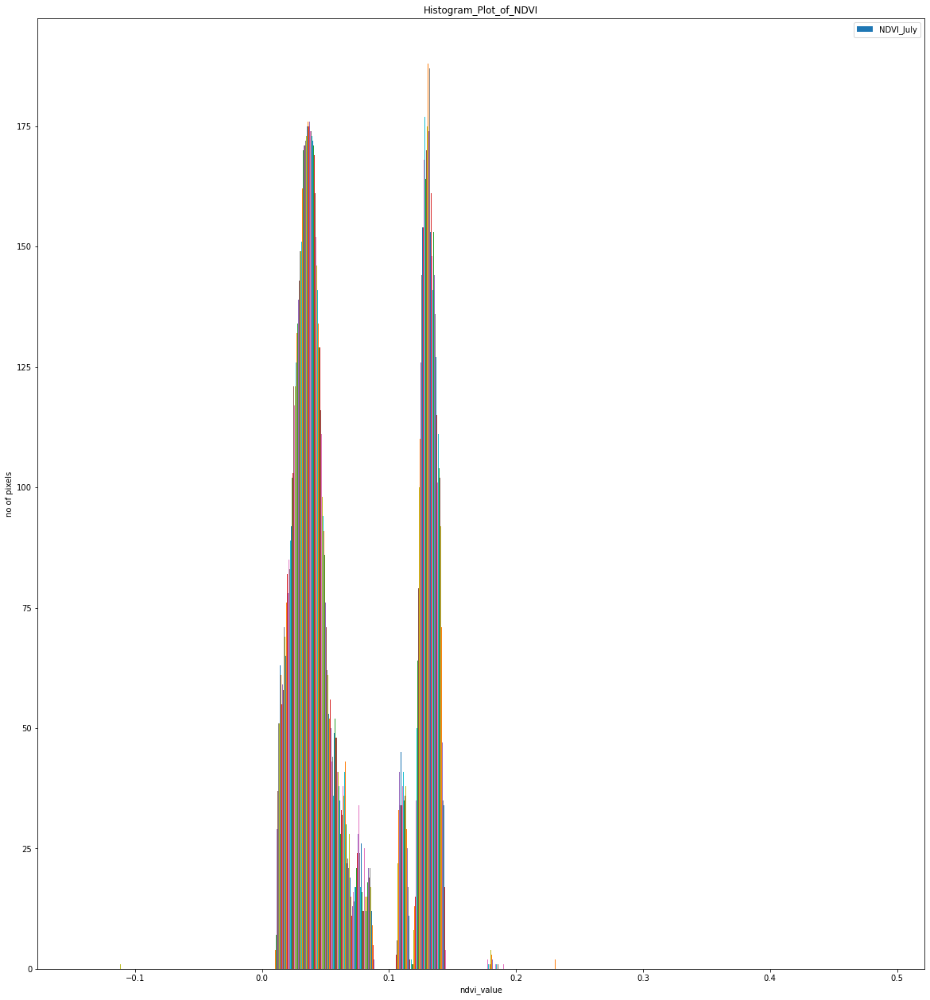

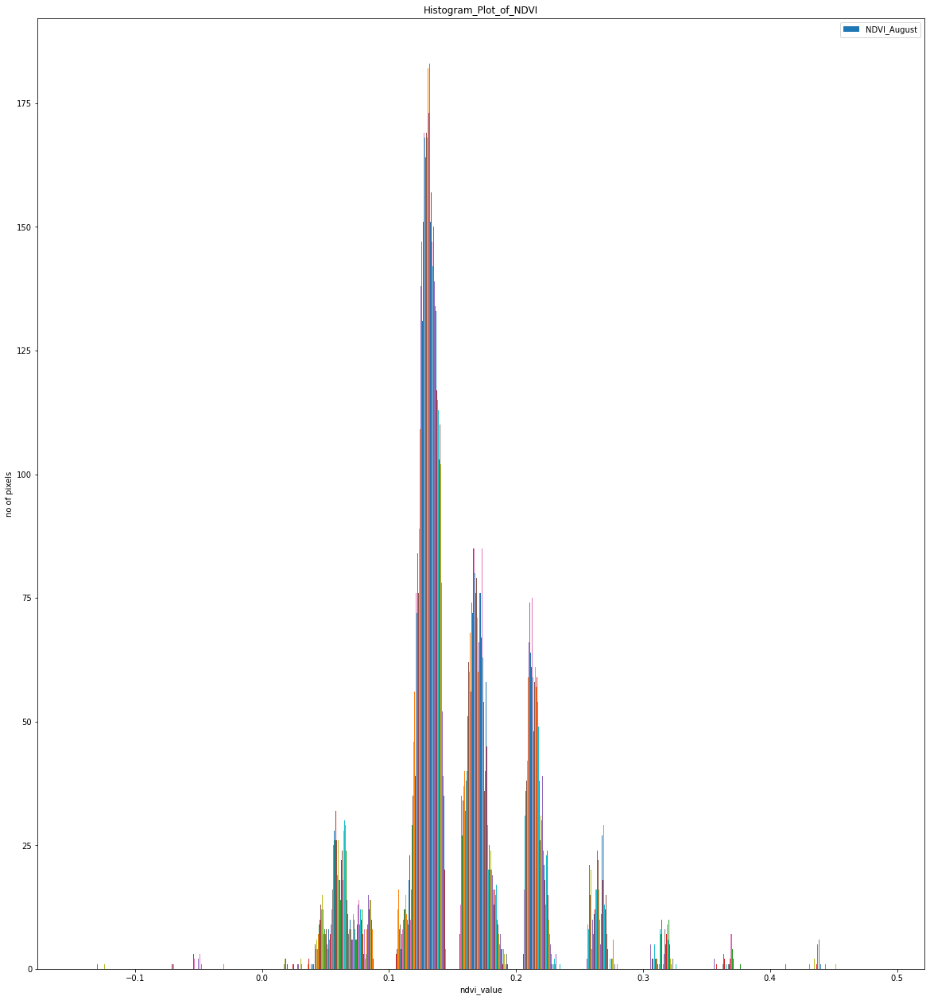

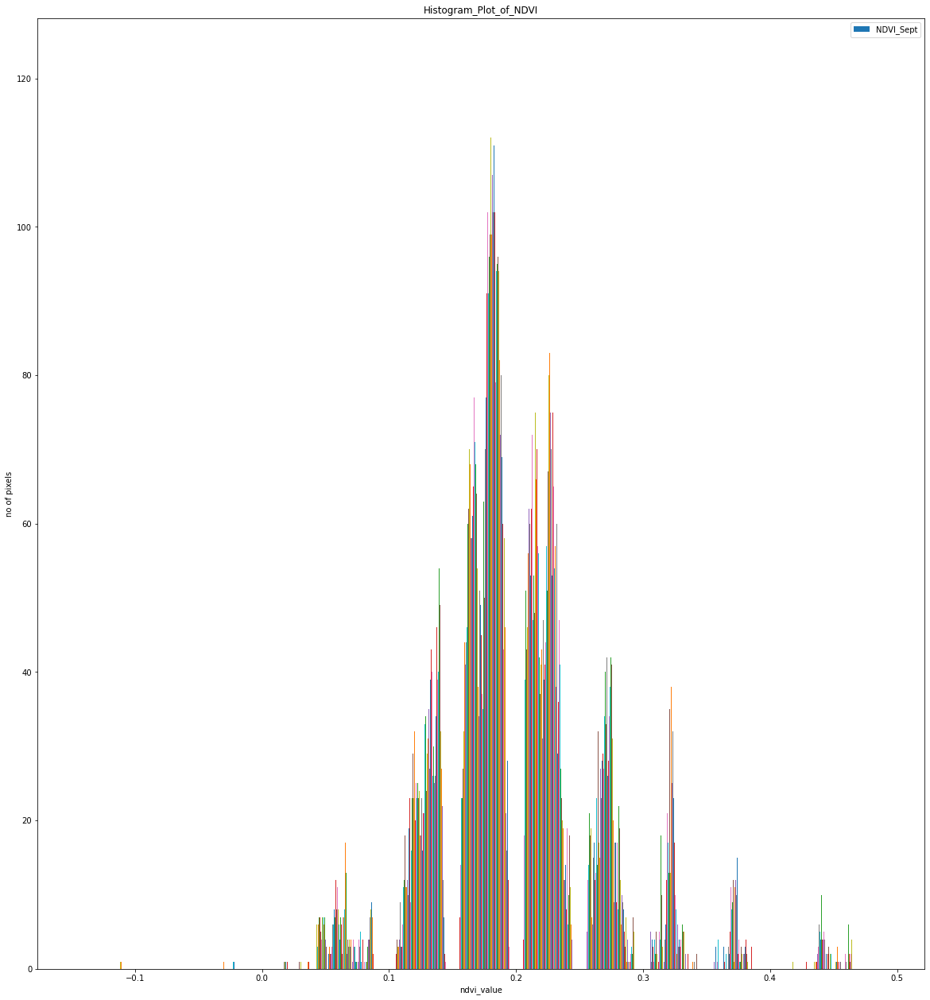

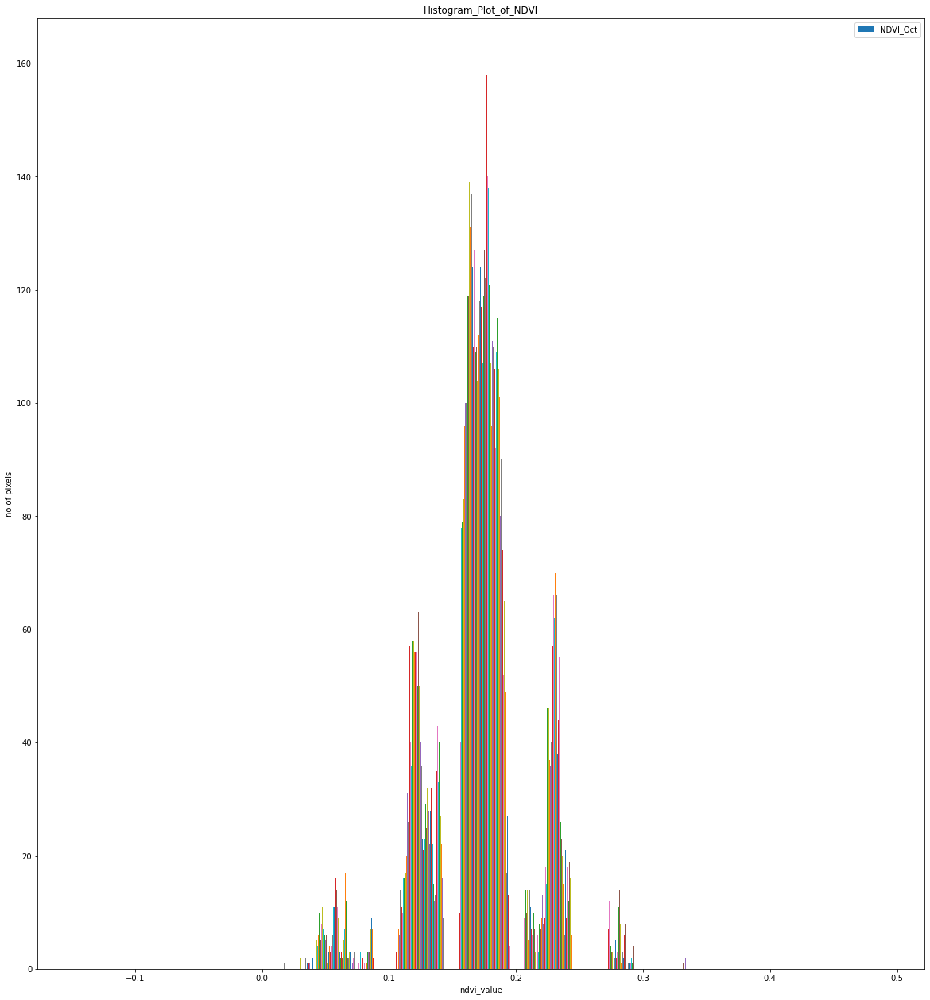

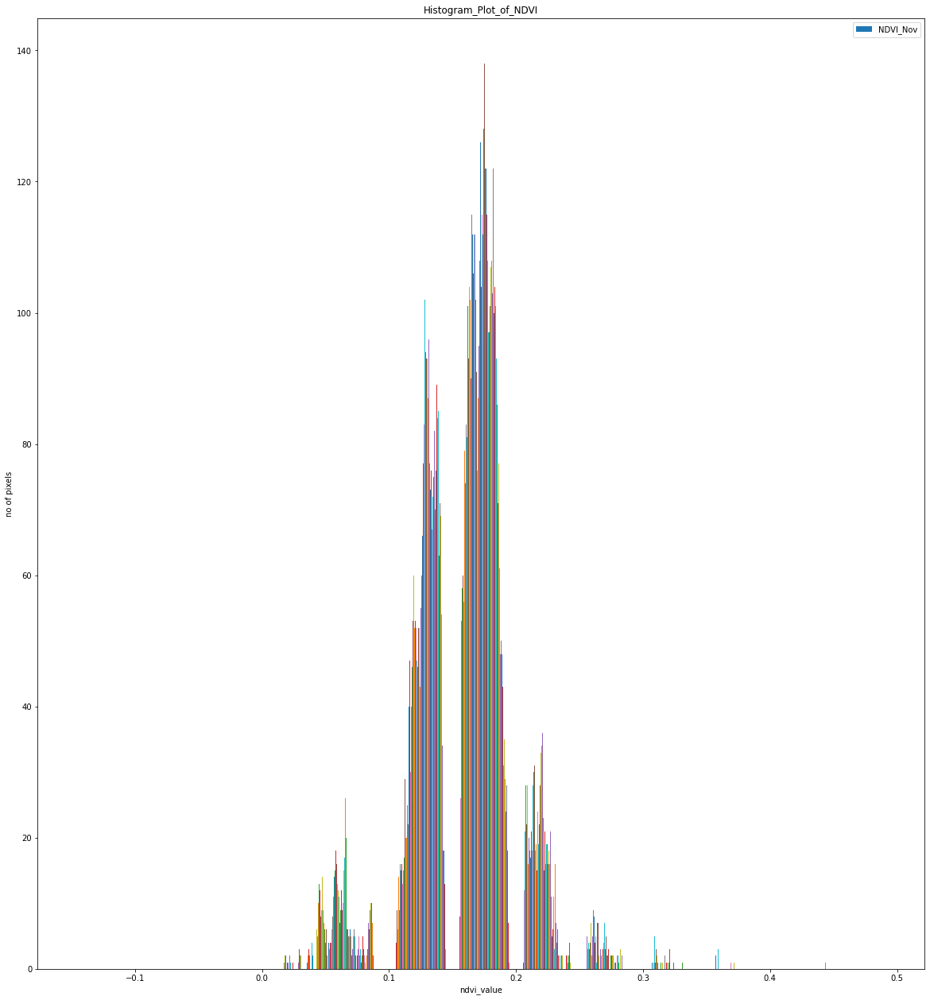

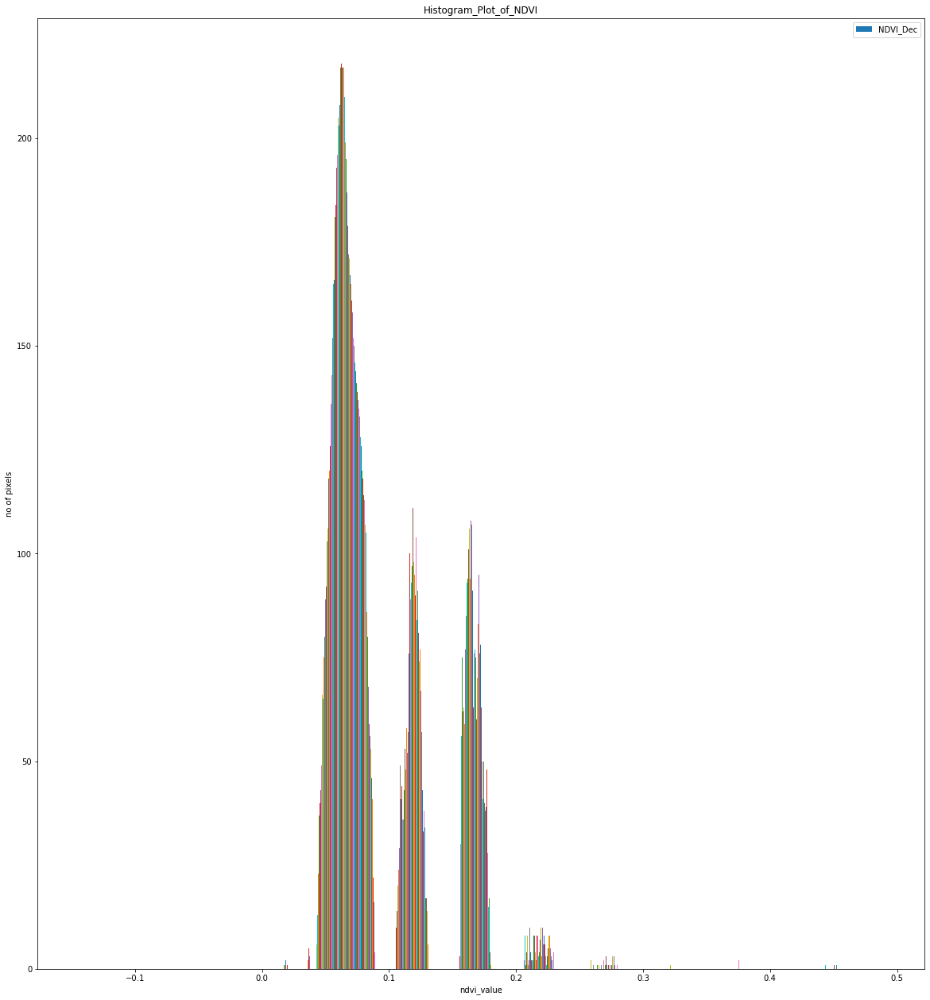

In [88]:
%matplotlib inline
def ndviplot(dataset,name):
 
 dataset1=dataset.read(1)
#  print(dataset1)
#  print(type(dataset1))
#  print(dataset.width)
#  print(dataset.height)
#  n_bins = 5
 legend=['NDVI_'+name]
 fig, ax = plt.subplots(figsize =(20,22))
 plt.hist(dataset1,bins=[-0.15,-0.1,0.0,0.1,0.15,0.20,0.25,0.3,0.35,0.4,0.5])
 plt.xlabel("ndvi_value")
 plt.ylabel("no of pixels")
 plt.legend(legend)
 plt.title('Histogram_Plot_of_NDVI')
 plt.tight_layout
 plt.show() 

in7=rasterio.open('https://github.com/UdayKumar0711/cropinsure/blob/main/ndvi_224_reproject.tif?raw=true')

in8=rasterio.open('https://github.com/UdayKumar0711/cropinsure/blob/main/ndvi_256_reproject.tif?raw=true')
in9=rasterio.open('https://github.com/UdayKumar0711/cropinsure/blob/main/ndvi_288_reproject.tif?raw=true')
in10=rasterio.open('https://github.com/UdayKumar0711/cropinsure/blob/main/ndvi_320_reproject.tif?raw=true')
in11=rasterio.open('https://github.com/UdayKumar0711/cropinsure/blob/main/ndvi_352_reproject.tif?raw=true')
in12=rasterio.open('https://github.com/UdayKumar0711/cropinsure/blob/main/ndvi_384_reproject.tif?raw=true')
ndviplot(in7,'July')
ndviplot(in8,'August')
ndviplot(in9,'Sept')
ndviplot(in10,'Oct')
ndviplot(in11,'Nov')
ndviplot(in12,'Dec')


In [84]:

def plot(data_set,name):
 
 data_set1=data_set.read(1)
#print(data_set1)
 
 fig = px.histogram(data_set1, 
                   title='Histogram_NDVI_'+ name,
               
                   opacity=0.8,
               
                   color_discrete_sequence=['indianred'] 
                   )
 fig.show()
    
in_7=rasterio.open('https://github.com/UdayKumar0711/cropinsure/blob/main/ndvi_224_reproject.tif?raw=true')
in8_=rasterio.open('https://github.com/UdayKumar0711/cropinsure/blob/main/ndvi_256_reproject.tif?raw=true')
in9_=rasterio.open('https://github.com/UdayKumar0711/cropinsure/blob/main/ndvi_288_reproject.tif?raw=true')
in10_=rasterio.open('https://github.com/UdayKumar0711/cropinsure/blob/main/ndvi_320_reproject.tif?raw=true')
in11_=rasterio.open('https://github.com/UdayKumar0711/cropinsure/blob/main/ndvi_352_reproject.tif?raw=true')
in12_=rasterio.open('https://github.com/UdayKumar0711/cropinsure/blob/main/ndvi_384_reproject.tif?raw=true')
plot(in_7,'July')
plot(in8_,'Aug')
plot(in9_,'Sept')
plot(in10_,'Oct')
plot(in11_,'Nov')
plot(in12_,'Dec')

[[-1. -1. -1. ... -1. -1. -1.]
 [-1. -1. -1. ... -1. -1. -1.]
 [-1. -1. -1. ... -1. -1. -1.]
 ...
 [-1. -1. -1. ... -1. -1. -1.]
 [-1. -1. -1. ... -1. -1. -1.]
 [-1. -1. -1. ... -1. -1. -1.]]


[[-1. -1. -1. ... -1. -1. -1.]
 [-1. -1. -1. ... -1. -1. -1.]
 [-1. -1. -1. ... -1. -1. -1.]
 ...
 [-1. -1. -1. ... -1. -1. -1.]
 [-1. -1. -1. ... -1. -1. -1.]
 [-1. -1. -1. ... -1. -1. -1.]]


[[-1. -1. -1. ... -1. -1. -1.]
 [-1. -1. -1. ... -1. -1. -1.]
 [-1. -1. -1. ... -1. -1. -1.]
 ...
 [-1. -1. -1. ... -1. -1. -1.]
 [-1. -1. -1. ... -1. -1. -1.]
 [-1. -1. -1. ... -1. -1. -1.]]


[[-1. -1. -1. ... -1. -1. -1.]
 [-1. -1. -1. ... -1. -1. -1.]
 [-1. -1. -1. ... -1. -1. -1.]
 ...
 [-1. -1. -1. ... -1. -1. -1.]
 [-1. -1. -1. ... -1. -1. -1.]
 [-1. -1. -1. ... -1. -1. -1.]]


[[-1. -1. -1. ... -1. -1. -1.]
 [-1. -1. -1. ... -1. -1. -1.]
 [-1. -1. -1. ... -1. -1. -1.]
 ...
 [-1. -1. -1. ... -1. -1. -1.]
 [-1. -1. -1. ... -1. -1. -1.]
 [-1. -1. -1. ... -1. -1. -1.]]


[[-1. -1. -1. ... -1. -1. -1.]
 [-1. -1. -1. ... -1. -1. -1.]
 [-1. -1. -1. ... -1. -1. -1.]
 ...
 [-1. -1. -1. ... -1. -1. -1.]
 [-1. -1. -1. ... -1. -1. -1.]
 [-1. -1. -1. ... -1. -1. -1.]]
